# SIR Model Simulation: Overview

**SIR (Susceptible-Infected-Recovered)**

### Step 1: Set Parameters
- **Transmission rate (`beta`)**: Defines how quickly the disease spreads from infected individuals to those who are susceptible.
- **Recovery rate (`gamma`)**: Defines how quickly infected individuals recover and become immune.
- **Initial Infected (`initial_infected`)**: The number of people infected at the beginning of the simulation.
- **Time Steps (`time_steps`)**: The length of time over which we simulate the infection spread.

### Step 2: SIR Model Equations
The **SIR model** uses **ordinary differential equations (ODEs)** to represent the dynamics of three groups: `Susceptible (S)`, `Infected (I)`, and `Recovered (R)`:

- $$\frac{dS}{dt} = -\beta \cdot S \cdot I$$  
  This equation describes how the number of susceptible individuals decreases as they come into contact with infected individuals.

- $$\frac{dI}{dt} = \beta \cdot S \cdot I - \gamma \cdot I$$  
  This equation shows the change in the number of infected individuals, accounting for both new infections and recoveries.

- $$\frac{dR}{dt} = \gamma \cdot I$$  
  This equation describes how quickly infected individuals recover and move into the recovered group.

### Step 3: Solve the Equations
- **Initial conditions** are defined for each group:
  - `S0`: Initial number of susceptible individuals.
  - `I0`: Initial number of infected individuals.
  - `R0 = 0`: Initially, there are no recovered individuals.
- The system of differential equations is solved over a defined time period using `solve_ivp` from the SciPy library.

### Step 4: Plot the Results
- The **results** of the SIR model are plotted to show the `Susceptible`, `Infected`, and `Recovered` groups over time.
- The plot helps illustrate how the epidemic evolves, showing the changes in each group over the time - t.


1. **Basic Deterministic Model**: Foundational version using deterministic equations.


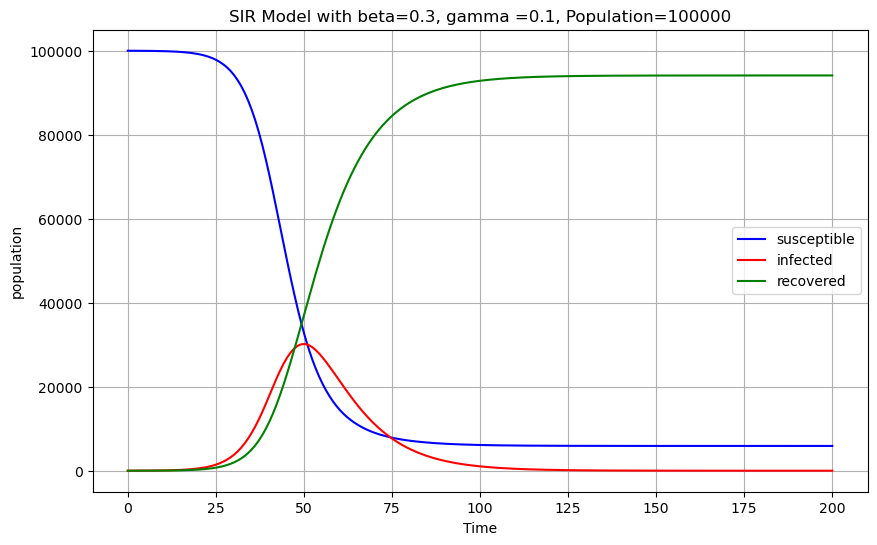

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# step 1 -  Define Parameters
beta = 0.3  # transmission rate
gamma = 0.1  # recovery rate
initial_infected = 10  # Initial number of infected individuals
time_steps = 200  # Number of time steps to simulate

# Define the SIR Model
def sir_model(t, y, population_size):
    S, I, R = y
    dSdt = -beta * S * I / population_size
    dIdt = beta * S * I / population_size - gamma * I
    dRdt = gamma * I
    return [dSdt, dIdt, dRdt]

# Population sizes to simulate
population_sizes = [100000]

# for loop
for population_size in population_sizes:
    # Step 4: Solve the Model
    S0 = population_size - initial_infected
    I0 = initial_infected
    R0 =0
    initial_conditions = [S0, I0, R0]
    t = np.linspace(0, time_steps, time_steps)

    # Solve the differential equations
    solution = solve_ivp(sir_model, [0, time_steps], initial_conditions, t_eval=t, args=(population_size,))

    # plot the Results
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(solution.t, solution.y[0], label='susceptible', color='blue')
    ax.plot(solution.t, solution.y[1], label='infected', color='red')
    ax.plot(solution.t, solution.y[2], label='recovered', color='green')
    ax.set_xlabel('Time')
    ax.set_ylabel('population')
    ax.set_title(f"SIR Model with beta={beta}, gamma ={gamma}, Population={population_size}")
    ax.legend()
    ax.grid()
    plt.show()


# SVIR Model: Differential Equations Overview

In thl part of the project, I simulate an **SVIR (Susceptible-Vaccinated-Infected-Recovered)** model. This model adds a vaccinated group to understand how vaccination, infection, recovery, and natural changes in the population work together over time.

### Step 1: Define the SVIR Model Equat
in this model we consider the natural changes likes: Births , Natural Deaths , Immunity Loss , Vaccinated may lose immunityions
- The **SVIR model** uses four differential equations to show changes in `Susceptible (S)`, `Vaccinated (V)`, `Infected (I)`, and `Recovered (R)` groups over time:

  - $$\frac{dS}{dt} = A - B_1 \cdot S \cdot I - X \cdot S - M \cdot S$$  
    The number of **susceptible** people changes due to **births** ($A$), **new infections**, **vaccinations**, and **natural deaths** ($M$).

  - $$\frac{dV}{dt} = X \cdot S - B_2 \cdot V \cdot I - (G + M) \cdot V$$  
    The **vaccinated** group increases as more **susceptible** people get vaccinated, but decreases due to **infections**, **recoveries**, and **natural deaths**.

  - $$\frac{dI}{dt} = B_1 \cdot S \cdot I + B_2 \cdot V \cdot I - D \cdot I - M \cdot I$$  
    The **infected** group changes based on **new infections** from both susceptible and vaccinated groups, **recoveries** ($D$), and **natural deaths**.

  - $$\frac{dR}{dt} = G \cdot V + D \cdot I - M \cdot R$$  
    The **recovered** group grows due to **recoveries** from vaccination and infection, and decreases due to **natural deaths** ($M$).

### Step 2: Set Parameters
- **A**: **Birth rate**, which adds new people to the population.
- **B1, B2**: **Transmission rates**, where $B_1$ is for susceptible-infected interactions and $B_2$ is for vaccinated-infected interactions.
- **X**: **Vaccination rate**, which is how fast susceptible people get vaccinated.
- **M**: **Mortality rate**, representing natural deaths for all groups.
- **G, D**: **Recovery rates**, for vaccinated and infected groups.

### Step 3: Initial Conditions and Simulation Setup
- Set the initial population fractions for each group:
  - **S0**: Initial fraction of susceptible people.
  - **V0**: Initial fraction of vaccinated people.
  - **I0**: Initial fraction of infected people.
  - **R0**: Initial fraction of recovered people.
- Create a **time grid** to simulate the changes over **200 days**.

### Step 4: Solve the SVIR Model
- Use the **`odeint`** function from SciPy to solve the SVIR equations.
- The **solution** shows how the `S`, `V`, `I`, and `R` groups change over time.

### Step 5: Plotting the Dynamics
- Plot the **population dynamics** to see how the fractions of `Susceptible`, `Vaccinated`, `Infected`, and `Recovered` people change over time.

### Key Observations from the SVIR Model
- The **SVIR model** shows more complex interactions, including how vaccination affects the spread of the disease and how risks differ ween vaccinated and unvaccinated people.
r between vaccinated and unvaccinated people.


     time (days)  susceptible (s)  vaccinated (v)  infected (i)  \
0       0.000000     90000.000000     1000.000000  3.000000e+03   
1       0.400802     86195.912698     4406.754624  3.069300e+03   
2       0.801603     82562.703865     7516.789676  3.130278e+03   
3       1.202405     79093.755051    10349.689218  3.182652e+03   
4       1.603206     75782.639015    12923.965317  3.226234e+03   
..           ...              ...             ...           ...   
495   198.396794      9090.909108     8264.463181 -2.912182e-07   
496   198.797595      9090.909107     8264.463163 -2.771147e-07   
497   199.198397      9090.909107     8264.463146 -2.568914e-07   
498   199.599198      9090.909106     8264.463129 -2.299206e-07   
499   200.000000      9090.909105     8264.463113 -1.955356e-07   

     recovered (r)       deaths  
0         0.000000  6000.000000  
1       352.032164  5976.000032  
2       838.132755  5952.096064  
3      1445.615794  5928.287711  
4      2162.587154  5904.

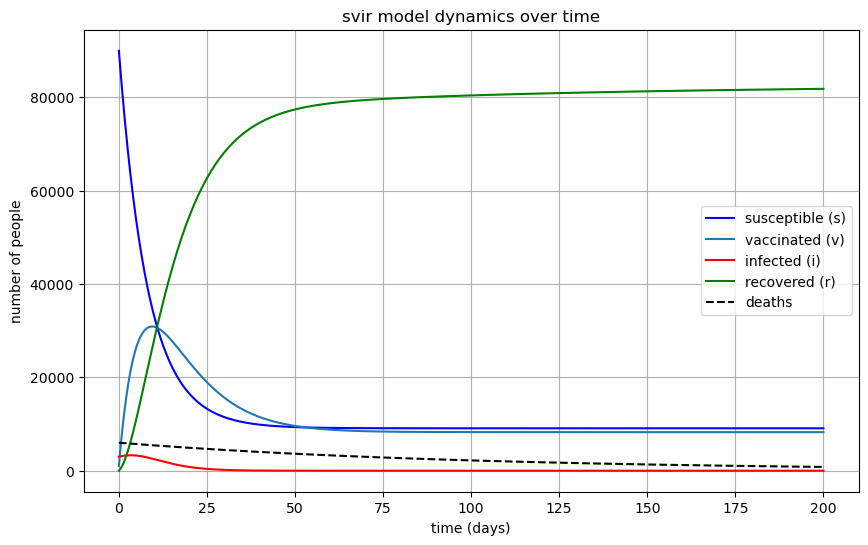

In [56]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import pandas as pd

# svir Model - Differential Equations
def svir_model(y, t, params):
    s, v, i, r = y  # variables
    a, b1, b2, x, m, g, d = params  # parameters
    
    # differential equations
    dsdt = a - b1 * s * i - x * s - m * s
    dvdt = x * s - b2 * v * i - (g + m) * v
    didt = b1 * s * i + b2 * v * i - d * i - m * i
    drdt = g * v + d * i - m * r
    
    return [dsdt, dvdt, didt, drdt]

#parameters
a = 0.01      # birth rate
b1 = 0.3      # transmission rate (susceptible-infected)
b2 = 0.1      # transmission rate (vaccinated-infected)
x = 0.1       # vaccination rate
m = 0.01      # mortality rate
g = 0.1       # recovery rate (vaccinated)
d = 0.2       # recovery rate (infected)


# pack parameters into a tuple for th ode,to solve the equations.
params = (a, b1, b2, x, m, g, d)

# initial conditions   : Adjust based on the population
s0 = 0.9      # initial susceptible fraction
v0 = 0.01     # initial vaccinated fraction
i0 = 0.03     # initial infected fraction
r0 = 0.0      # initial recovered fraction

# initial state vector
y0 = [s0, v0, i0, r0]

# time grid 
t = np.linspace(0, 200, 500)

# population size
n = 100000  

# Solve the svir model 
solution = odeint(svir_model, y0, t, args=(params,))

# Extract results
s, v, i, r = solution.T

# convert fractions to actual number of people
s = s * n
v = v * n
i = i * n
r = r * n

# calculate the number of deaths over time
initial_population = n
current_population = s + v + i + r
deaths = initial_population - current_population

# print the values of each group over time
data = {
    'time (days)': t,
    'susceptible (s)': s,
    'vaccinated (v)': v,
    'infected (i)': i,
    'recovered (r)': r,
    'deaths': deaths
}

results_df = pd.DataFrame(data)
print(results_df)

# plot the dynamics with specific colors
plt.figure(figsize=(10, 6))
plt.plot(t, s, label='susceptible (s)', color='blue')  # susceptible in blue
plt.plot(t, v, label='vaccinated (v)')  # vaccinated in default color
plt.plot(t, i, label='infected (i)', color='red')  # infected in red
plt.plot(t, r, label='recovered (r)', color='green')  # recovered in green
plt.plot(t, deaths, label='deaths', linestyle='--', color='black')  # deaths in black dashed line
plt.xlabel('time (days)')
plt.ylabel('number of people')
plt.title('svir model dynamics over time')
plt.legend()
plt.grid()
plt.show()


# Stochastic Grid-Based Infection Simulation : Overview

This section models how an infectious disease spreads in a **gr d-based simulation**. Here, each agent represents one person, and their interactions are based on probabilities.

### Step 1: Set Parameters
- **Grid Size**: The size of the simulation area.
- **Initial Infected Agents**: The number of people infected at the start.
- **Transmission Probability**: The chance that an infected person infects a nearby healthy person.
- **Immunity Loss Probability**: The chance that a recovered person becomes susceptible again.
- **Recovery Time Distribution**: Recovery times for infected people are chosen randomly from a **normal distribution** to add variety.
- **Time Steps**: The total number of rounds the simulation will run.

### Step 2: Initiali
ze thegrid represent the pepole , the number of the poeple is (grid)^2 .
 **people**.
- Each person starts as `Susceptible (S)`, with a few randomly chosen as `Infected (I)`.
- For infected people, a random **recovery time** is assigned to add differences in how long they take to recover.

### Step 3: Define Neighbor Interactions
- **Neighbors**: Each person can interact with their **direct neighbors** (up, down, left, right).
- These interactions determine how the infection spreads.

### Step 4: Track and Visualize the Infection
- The simulation tracks how many `Susceptible`, `Infected`, and `Recovered` people there are at each time step.
- **Colors** are used t, **Recovered (green)**.

### Step 5: Run the Simulation
- At each **time step**:
  - Infected people interact with their neighbors, possibly spreading the infection based on the **transmission probability**.
  - **Recovery**: Infected people recover if they reach the end of their recovery time.
  - **Immunity Loss**: Recovered people might lose immunity and become susceptible again.
- The grid iand s visualized at each time step using a heatma ata any moment.** to show each person's state.

### Step 6: Plot the Infection Curve
- At the end of the simulation, an **infection curve** is plotted to show how the number of `Susceptible`, `Infected`, and `Recovered` people changes over time.
- This curve helps show how the infection spreads, 
reaches a peak, and then declines.


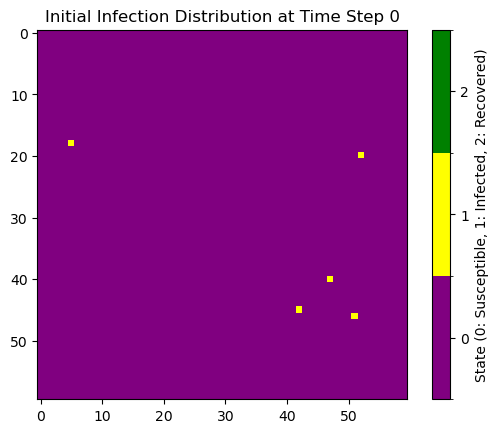

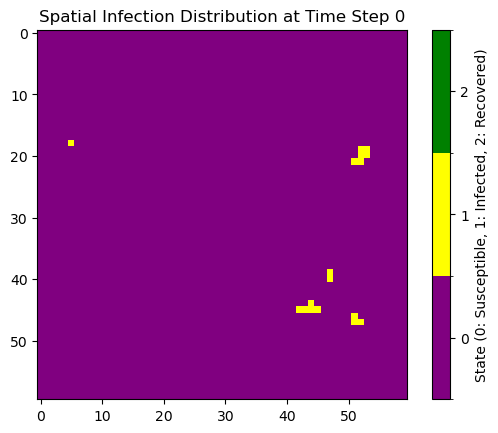

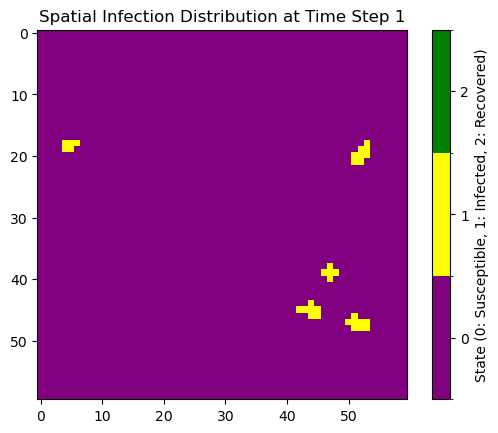

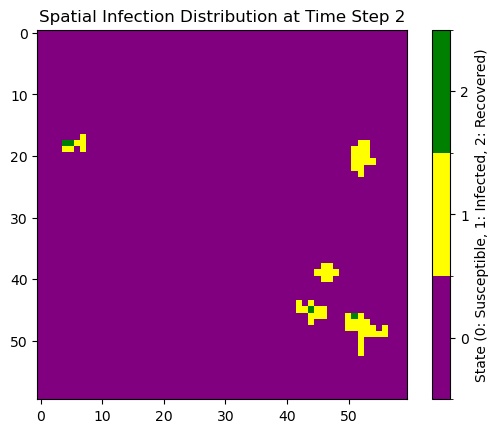

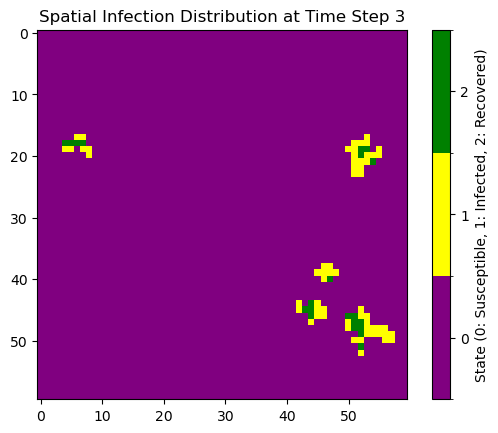

...

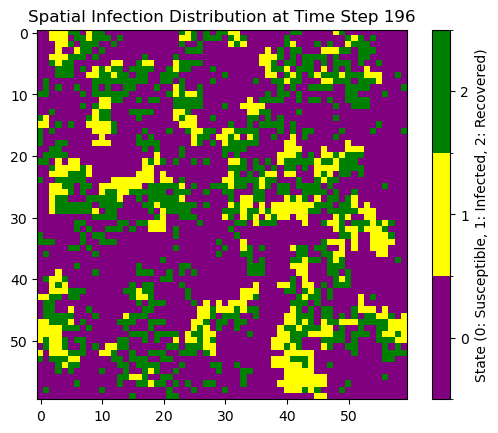

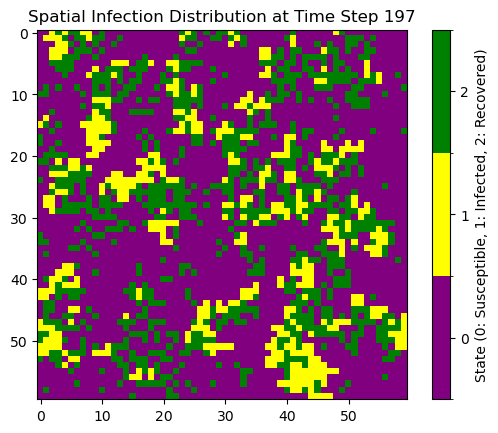

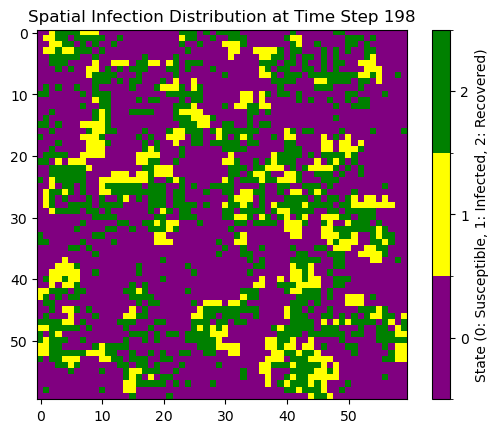

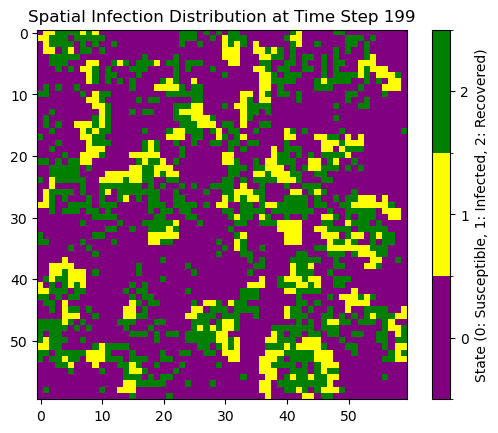

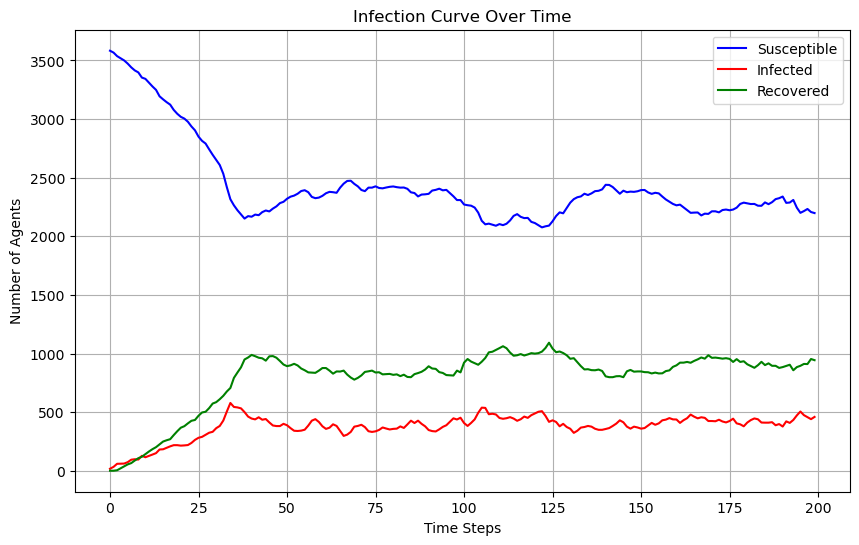

In [66]:
# sthochastic

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random

# Parameters
grid_size = 60  # Size of the grid 
initial_infected = 5  # initial number of infected agents
transmission_probability = 0.3
immunity_loss_probability = 0.15

# parameters for recovery time distribution (Normal distribution)
recovery_time_mean = 5
recovery_time_std = 1

time_steps = 200 



# initialize the grid and agents
class Agent:
    def __init__(self):
        self.state = 'S'  # Susceptible by default
        self.days_infected = 0  # count number of days infected if the agent is infected
        self.recovery_time = 0  # individual recover time

grid = [[Agent() for _ in range(grid_size)] for _ in range(grid_size)]

# randomly infect initial agents and set their individual recovery times
infected_positions = set()
while len(infected_positions) < initial_infected:
    i, j = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    if (i, j) not in infected_positions:
        grid[i][j].state = 'I'
        grid[i][j].recovery_time = max(1, int(np.random.normal(recovery_time_mean, recovery_time_std)))
        infected_positions.add((i, j))  # Add to the set to ensure unique infection locations

#   function to get neighboring agents in the grid
def get_neighbors(i, j):
    neighbors = []
    directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]  # Up, Down, Left,Right
    for di, dj in directions:
        ni, nj = i + di, j + dj
        if 0 <= ni < grid_size and 0 <= nj < grid_size:
            neighbors.append((ni, nj))
    return neighbors

#Track counts for plotting
susceptible_counts = []
infected_counts = []
recovered_counts = []

# colormap
cmap = mcolors.ListedColormap(['purple', 'yellow', 'green'])
bounds = [-0.5, 0.5, 1.5, 2.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Plotting
grid_state = np.zeros((grid_size, grid_size))
for i in range(grid_size):
    for j in range(grid_size):
        if grid[i][j].state == 'S':
            grid_state[i, j] = 0  # susceptible
        elif grid[i][j].state == 'I':
            grid_state[i, j] = 1  # infected
        elif grid[i][j].state == 'R':
            grid_state[i, j] = 2  # recovered

plt.imshow(grid_state, cmap=cmap, norm=norm)
plt.title("Initial Infection Distribution at Time Step 0")
plt.colorbar(label="State (0: Susceptible, 1: Infected, 2: Recovered)", boundaries=bounds, ticks=[0, 1, 2])
plt.show()

# run the simulation
for t in range(time_steps):
    # Iterate through each agent and simulate interactions
    for i in range(grid_size):
        for j in range(grid_size):
            agent = grid[i][j]
            
            if agent.state == 'I':
                # increment infection duration
                agent.days_infected += 1
                # Check if the infection duration arrived to the individual recovery time
                if agent.days_infected >= agent.recovery_time:
                    agent.state = 'R'  # transition state to recovered
                    agent.days_infected = 0  # reset infection counter

                else:
                    # if still infected, interact with neighbors
                    neighbors = get_neighbors(i, j)
                    for ni, nj in neighbors:
                        neighbor = grid[ni][nj]
                        # If the neighbor is susceptible, there is a chance that they can get infected
                        if neighbor.state == 'S' and random.random() < transmission_probability:
                            neighbor.state = 'I'  # neighbor becomes infected
                            # Assign a new individual recovery time sampled from a normal distribution
                            neighbor.recovery_time = max(1, int(np.random.normal(recovery_time_mean, recovery_time_std)))
                            neighbor.days_infected = 1  # Start infection counter for the newly infected

            elif agent.state == 'R':
                # recovered agents may lose immunity and return to susceptible state
                if random.random() < immunity_loss_probability:
                    agent.state = 'S'  # Become susceptible again

    # Count agents in each state for plotting
    susceptible_count = sum(agent.state == 'S' for row in grid for agent in row)
    infected_count = sum(agent.state == 'I' for row in grid for agent in row)
    recovered_count = sum(agent.state == 'R' for row in grid for agent in row)
    susceptible_counts.append(susceptible_count)
    infected_counts.append(infected_count)
    recovered_counts.append(recovered_count)

    # plot the grid state heatmap for each time step
    grid_state = np.zeros((grid_size, grid_size))
    for i in range(grid_size):
        for j in range(grid_size):
            if grid[i][j].state == 'S':
                grid_state[i, j] = 0  # susceptible
            elif grid[i][j].state == 'I':
                grid_state[i, j] = 1  # infected
            elif grid[i][j].state == 'R':
                grid_state[i, j] = 2  

    plt.imshow(grid_state, cmap=cmap, norm=norm)
    plt.title(f"Spatial Infection Distribution at Time Step {t}")
    plt.colorbar(label="State (0: Susceptible, 1: Infected, 2: Recovered)", boundaries=bounds, ticks=[0, 1, 2])
    plt.pause(0.1)

plt.show()

# plotting infection curve (number of susceptible, infected, and recovered agents over the time)
plt.figure(figsize=(10, 6))
plt.plot(susceptible_counts, label="Susceptible", color="blue")
plt.plot(infected_counts, label="Infected", color="red")
plt.plot(recovered_counts, label="Recovered", color="green")
plt.xlabel("Time Steps")
plt.ylabel("Number of Agents")
plt.title("Infection Curve Over Time")
plt.legend()
plt.grid()
plt.show()


# Disease Spread Simulation with Vaccination: Overview
this is the final part of the project , in this s part of the code shows how a disease spreads while including **vaccination** and **immunity loss**. The goal is to see how vaccination and losing immunity (after recovering or getting vaccinated) affect the spread of the disease in a larger group of peopl
in the last sthochastic model i used at normal distribution to decide id poele recovered , in this part we dont use distribution, just probability over time.
.

### Step 1: Set Parameters
- **Grid Size**: The size ofpopulationgrid).
- **Initial Infected Agents**: The number of people infected at the start.
- **Transmission Probability**: The chance that a person catches the disease from an infected neighbor.
- **Recovery Probability**: The chance that an infected person recovers during each time step.
- **Immunity Loss Probability**: The chances of losing immunity after recovering (`recovery_immunity_loss_probability`) or after vaccination (`vaccination_immunity_loss_probability`).
- **Vaccination Probability**: The chance that a healthy person gets vaccinated during each time step.
- **Time Steps**: The totalsteps.
-  will run.

### Step 2: Initialize Agents
- Each person in the grid is represented by an **Agent class** and starts as **Susceptible (S)**.
- The **grid** is set up with a certain number of people who are **infected** at the persons in this group    determnetedginning, placed randomly.

### Step 3: Simulate Each Time Step
- During each **time step**, people move between these states:
  - **Susceptible (S)**
  - **Infected (I)**
  - **Recovered (R)**
  - **Vaccinated (V)**
- **State Changes**:
  - **Susceptible people** can either get **vaccinated** based on the vaccination chance or get **infected** if they interact with an infected neighbor.
  - **Infected people** have a chance to **recover** each time step.
  - **Recovered or vaccinated people** may lose immunity and become **susceptible** again, depending on their immunity loss chance.
- The `simulate_step()` function goes through each person and uses the above rules to decvaccination** and **immunity loss**.

### Key Observations
- Adding **vaccination** and **immunity loss** makes the model more realistic.
- The **infection curve** and **visualizations** help understand how vaccination affects the spread and how losing immunity changes the population over time.


Initialization Complete: Infected=5, Susceptible=3595


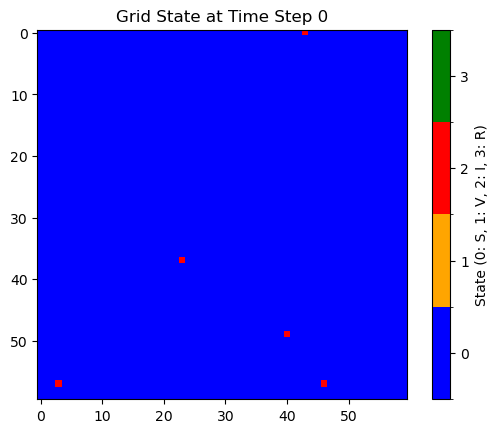

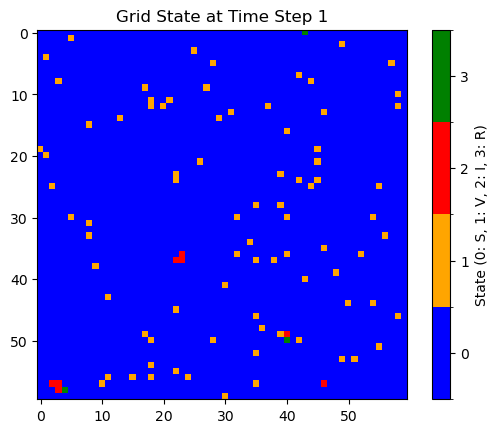

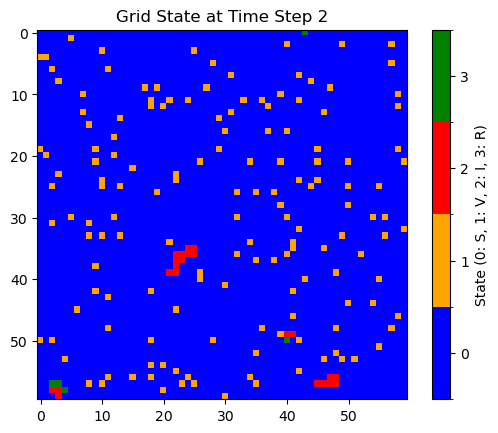

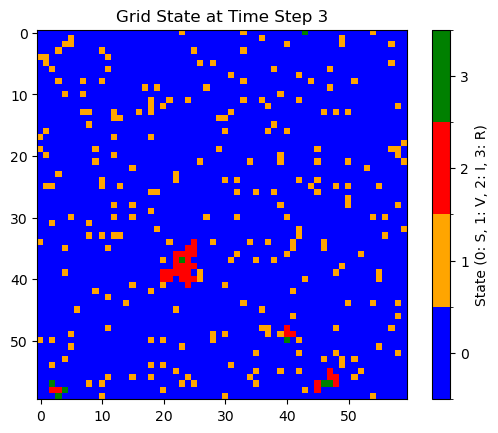

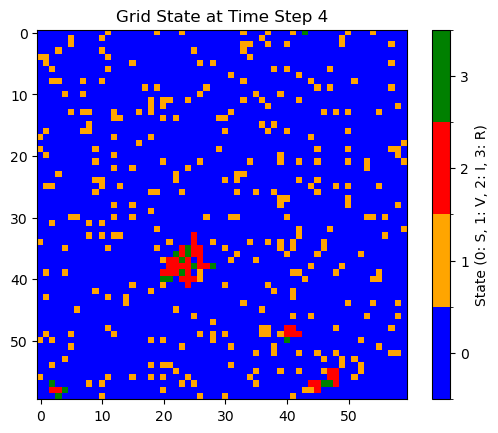

...

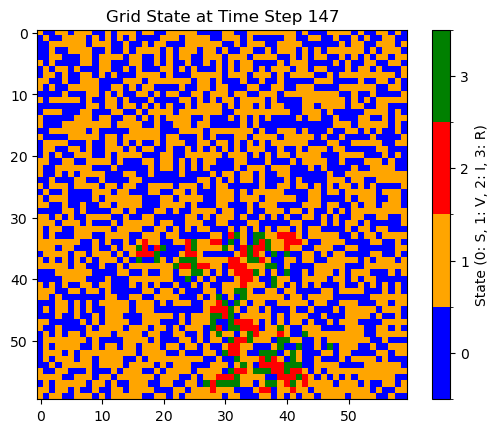

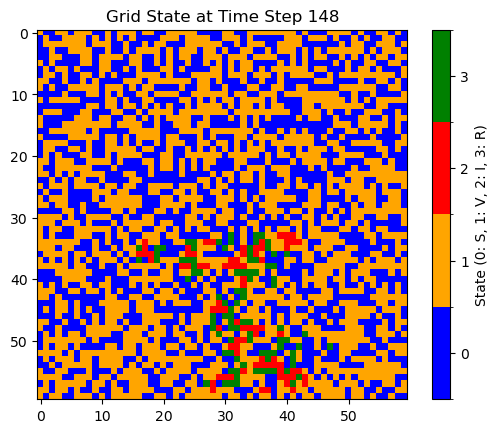

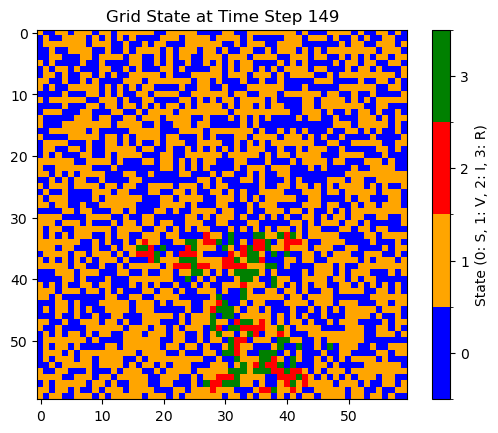

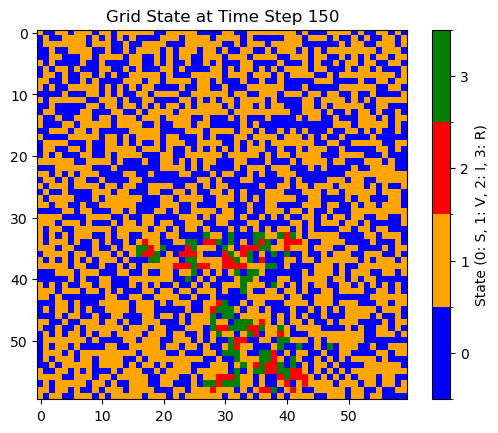

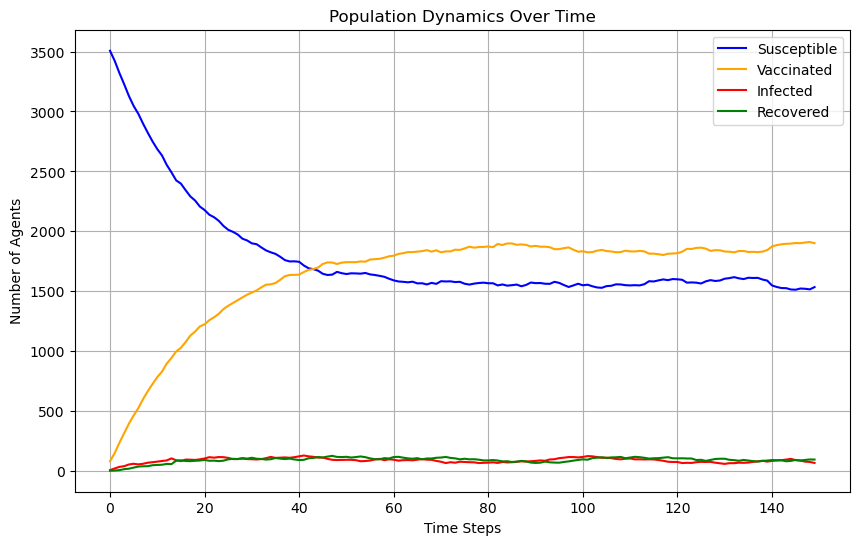

In [78]:
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Parameters
grid_size = 60  # size of the grid / the amount of the population 
initial_infected = 5  # Initial number of infected agents
transmission_probability = 0.3
recovery_probability = 0.15  # probability of recovery per time step
recovery_immunity_loss_probability = 0.15  # loss of immunity from recovery
vaccination_immunity_loss_probability = 0.02  # loss of immunity from vaccination
vaccination_probability = 0.025  # probability of vaccination
time_steps = 150  # the total number of steps




parameters = {
    'transmission_probability': transmission_probability,
    'recovery_probability': recovery_probability,
    'recovery_immunity_loss_probability': recovery_immunity_loss_probability,
    'vaccination_probability': vaccination_probability,
    'vaccination_immunity_loss_probability': vaccination_immunity_loss_probability
}

# Agent class
class Agent:
    def __init__(self):
        self.state = 'S'  # assume agents start as Susceptible ('S')



# Initialize grid

def initialize_grid(grid_size, initial_infected):
    # create grid with Susceptible agents
    grid = [[Agent() for _ in range(grid_size)] for _ in range(grid_size)]

    # randomly assign initial infected agents
    infected_positions = set()
    while len(infected_positions) < initial_infected:
        i, j = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
        if (i, j) not in infected_positions:
            grid[i][j].state = 'I'  # set state to Infected
            infected_positions.add((i, j))

    return grid

# Initialize the grid
grid = initialize_grid(grid_size, initial_infected)

# Verify Initialization (maybe delete this- dont sure how much neccesery after i checkded)
infected_count = sum(1 for row in grid for agent in row if agent.state == 'I')
susceptible_count = sum(1 for row in grid for agent in row if agent.state == 'S')
print(f"Initialization Complete: Infected={infected_count}, Susceptible={susceptible_count}")

# helper function -- to get neighboring agents
def get_neighbors(i, j, grid_size):
    neighbors = []
    directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]  # Up, Down, Left, Right
    for di, dj in directions:
        ni, nj = i + di, j + dj
        if 0 <= ni < grid_size and 0 <= nj < grid_size:
            neighbors.append((ni, nj))
    return neighbors

# simulate a single time step
def simulate_step(grid, parameters):
    grid_size = len(grid)
    transmission_probability = parameters['transmission_probability']
    recovery_probability = parameters['recovery_probability']
    recovery_immunity_loss_probability = parameters['recovery_immunity_loss_probability']
    vaccination_probability = parameters['vaccination_probability']
    vaccination_immunity_loss_probability = parameters['vaccination_immunity_loss_probability']

    for i in range(grid_size):
        for j in range(grid_size):
            agent = grid[i][j]

            if agent.state == 'I':  # Infected state
                # Recovery check
                if random.random() < recovery_probability:
                    agent.state = 'R'  # Recover
                else:
                    # Infect neighbors
                    neighbors = get_neighbors(i, j, grid_size)
                    for ni, nj in neighbors:
                        neighbor = grid[ni][nj]
                        if neighbor.state == 'S' and random.random() < transmission_probability:
                            neighbor.state = 'I'  # Neighbor becomes infected

            elif agent.state == 'R':  # Recovered state
                # immunity loss check
                if random.random() < recovery_immunity_loss_probability:
                    agent.state = 'S'  # Become susceptible again

            elif agent.state == 'S':  # Susceptible state
                # vaccination check
                if random.random() < vaccination_probability:
                    agent.state = 'V'  # Become vaccinated

            elif agent.state == 'V':  # Vaccinated state
                # immunity loss check
                if random.random() < vaccination_immunity_loss_probability:
                    agent.state = 'S'  # Become susceptible again

# record counts for each state
def record_counts(grid, time_series):
    states = {"S": 0, "V": 0, "I": 0, "R": 0}
    for row in grid:
        for agent in row:
            states[agent.state] += 1
    for key in time_series:
        time_series[key].append(states[key])

#colormap
cmap = mcolors.ListedColormap(['blue', 'orange', 'red', 'green'])
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# plottingg the grid state at a specific time step
def plot_grid(grid, t):
    grid_state = np.zeros((len(grid), len(grid)))
    for i in range(len(grid)):
        for j in range(len(grid[i])):
            state = grid[i][j].state
            grid_state[i, j] = {"S": 0, "V": 1, "I": 2, "R": 3}[state]

    plt.imshow(grid_state, cmap=cmap, norm=norm)
    plt.title(f"Grid State at Time Step {t}")
    plt.colorbar(label="State (0: S, 1: V, 2: I, 3: R)", boundaries=bounds, ticks=[0, 1, 2, 3])
    plt.show()

# plot infection curve
def plot_infection_curve(time_series):
    plt.figure(figsize=(10, 6))
    plt.plot(time_series["S"], label="Susceptible", color="blue")
    plt.plot(time_series["V"], label="Vaccinated", color="orange")
    plt.plot(time_series["I"], label="Infected", color="red")
    plt.plot(time_series["R"], label="Recovered", color="green")
    plt.xlabel("Time Steps")
    plt.ylabel("Number of Agents")
    plt.title("Population Dynamics Over Time")
    plt.legend()
    plt.grid()
    plt.show()

# State tracking
time_series = {"S": [], "V": [], "I": [], "R": []}

# Visualize the initial grid state at t=0
plot_grid(grid, t=0)

# run simulation with visualization
for t in range(1, time_steps + 1):  # Start from t=1
    simulate_step(grid, parameters)
    record_counts(grid, time_series)

    # Visualize the grid at certain intervals
    if t > -1:
        plot_grid(grid, t)

# Plot the infection curve at the end
plot_infection_curve(time_series)
